In [1]:
import numpy as np
import pandas as pd
import torch
import torch.nn as nn
from torch.cuda.amp import GradScaler, autocast
import matplotlib.pyplot as plt
from tqdm import tqdm  # Standard tqdm instead of tqdm.notebook
from pathlib import Path
import cv2 as cv
from PIL import Image
from torch.utils.data import DataLoader
from sklearn.model_selection import train_test_split
import albumentations as A
from albumentations.pytorch import ToTensorV2
from torchmetrics.image import StructuralSimilarityIndexMeasure as SSIM
from torchmetrics.regression import MeanSquaredError as MSE
from torchmetrics.collections import MetricCollection
import gc
from torchvision.transforms import Normalize
import os
from transformers import AutoImageProcessor, AutoModelForDepthEstimation
import torch
from torch import nn
import torch.nn.functional as F
from torch.utils.data import DataLoader
from torchvision.utils import make_grid
from torchvision.transforms.functional import to_pil_image
from torchvision.transforms import Normalize
import matplotlib.pyplot as plt
import pandas as pd
from transformers import AutoImageProcessor, AutoModelForDepthEstimation
from torchmetrics import StructuralSimilarityIndexMeasure, MeanSquaredError
import os
import numpy as np
device = 'cuda' if torch.cuda.is_available() else 'cpu'

/usr/local/lib/python3.10/dist-packages/albumentations/__init__.py:24: UserWarning: A new version of Albumentations is available: 2.0.5 (you have 1.4.20). Upgrade using: pip install -U albumentations. To disable automatic update checks, set the environment variable NO_ALBUMENTATIONS_UPDATE to 1.
  check_for_updates()


In [2]:
train_csv = Path('/kaggle/input/nyu-depth-v2/nyu_data/data/nyu2_train.csv')
train_ims_path = Path('/kaggle/input/nyu-depth-v2/nyu_data/data/nyu2_train')
base_path = Path('/kaggle/input/nyu-depth-v2/nyu_data')
df = pd.read_csv(train_csv, header=None)
df[0] = df[0].map(lambda x: base_path / x)
df[1] = df[1].map(lambda x: base_path / x)
train_df, val_df = train_test_split(df, test_size=0.1, shuffle=True)
val_df, test_df = train_test_split(val_df, test_size=0.1, shuffle=True)
train_df.reset_index(drop=True, inplace=True)
val_df.reset_index(drop=True, inplace=True)
test_df.reset_index(drop=True, inplace=True)
print(len(train_df), len(val_df), len(test_df))
train_df

45619 4562 507


,0,1
0,/kaggle/input/nyu-depth-v2/nyu_data/data/nyu2_...,/kaggle/input/nyu-depth-v2/nyu_data/data/nyu2_...
1,/kaggle/input/nyu-depth-v2/nyu_data/data/nyu2_...,/kaggle/input/nyu-depth-v2/nyu_data/data/nyu2_...
2,/kaggle/input/nyu-depth-v2/nyu_data/data/nyu2_...,/kaggle/input/nyu-depth-v2/nyu_data/data/nyu2_...
3,/kaggle/input/nyu-depth-v2/nyu_data/data/nyu2_...,/kaggle/input/nyu-depth-v2/nyu_data/data/nyu2_...
4,/kaggle/input/nyu-depth-v2/nyu_data/data/nyu2_...,/kaggle/input/nyu-depth-v2/nyu_data/data/nyu2_...
...,...,...
45614,/kaggle/input/nyu-depth-v2/nyu_data/data/nyu2_...,/kaggle/input/nyu-depth-v2/nyu_data/data/nyu2_...
45615,/kaggle/input/nyu-depth-v2/nyu_data/data/nyu2_...,/kaggle/input/nyu-depth-v2/nyu_data/data/nyu2_...
45616,/kaggle/input/nyu-depth-v2/nyu_data/data/nyu2_...,/kaggle/input/nyu-depth-v2/nyu_data/data/nyu2_...
45617,/kaggle/input/nyu-depth-v2/nyu_data/data/nyu2_...,/kaggle/input/nyu-depth-v2/nyu_data/data/nyu2_...


In [3]:
sample_tfms = [
    A.HorizontalFlip(),
    A.GaussNoise(p=0.2),
    A.OneOf([
        A.MotionBlur(p=.3),
        A.MedianBlur(blur_limit=3, p=0.3),
        A.Blur(blur_limit=3, p=0.5),
    ], p=0.3),
    A.RGBShift(),
    A.RandomBrightnessContrast(),
    A.RandomResizedCrop(384, 384),
    A.ColorJitter(),
    A.ShiftScaleRotate(shift_limit=0.1, scale_limit=0.3, rotate_limit=45, p=0.5),
    A.HueSaturationValue(p=0.3),
]
train_tfms = A.Compose([
    *sample_tfms,
    A.Resize(224, 224),
    A.Normalize(always_apply=True),
    ToTensorV2()
])
valid_tfms = A.Compose([
    A.Resize(224, 224),
    A.Normalize(always_apply=True),
    ToTensorV2()
])

class Dataset:
    def __init__(self, df, tfms):
        self.df = df
        self.tfms = tfms
        
    def open_im(self, p, gray=False):
        im = cv.imread(str(p))
        im = cv.cvtColor(im, cv.COLOR_BGR2GRAY if gray else cv.COLOR_BGR2RGB)
        return im
    
    def __len__(self):
        return len(self.df)
    
    def __getitem__(self, idx):
        s = self.df.iloc[idx, :]
        im, dp = s[0], s[1]
        im, dp = self.open_im(im), self.open_im(dp, True)
        augs = self.tfms(image=im, mask=dp)
        im, dp = augs['image'], augs['mask'] / 255.
        return im, dp.unsqueeze(0)

train_ds = Dataset(train_df, train_tfms)
val_ds = Dataset(val_df, valid_tfms)
test_ds = Dataset(test_df, valid_tfms)

num_workers = min(os.cpu_count(), len(train_ds))  # Use multiple workers
train_dl = DataLoader(train_ds, shuffle=True, batch_size=64, num_workers=num_workers, pin_memory=True)
val_dl = DataLoader(val_ds, shuffle=False, batch_size=64, num_workers=num_workers, pin_memory=True)
test_dl = DataLoader(test_ds, shuffle=True, batch_size=4, num_workers=num_workers, pin_memory=True)

In [4]:
import torch
from torch.utils.data import DataLoader
from transformers import AutoImageProcessor, AutoModelForDepthEstimation
from torchvision.utils import make_grid
import matplotlib.pyplot as plt
import numpy as np
from PIL import Image

from torchmetrics import MetricCollection
from torchmetrics.image import StructuralSimilarityIndexMeasure as SSIM
from torchmetrics import MeanSquaredError as MSE

# Set device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Load MiDaS v3.1
processor = AutoImageProcessor.from_pretrained("Intel/dpt-swinv2-tiny-256")
model = AutoModelForDepthEstimation.from_pretrained("Intel/dpt-swinv2-tiny-256").to(device)

preprocessor_config.json:   0%|          | 0.00/425 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/3.72k [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/164M [00:00<?, ?B/s]

In [5]:
# import cv2 as cv
# import torch
# import matplotlib.pyplot as plt
# from torchvision.transforms.functional import to_pil_image
# from PIL import Image

# def plot_preds(images, preds, gts, figsize=(10, 7), title="Depth Estimation Results"):
#     fig, axs = plt.subplots(3, len(images), figsize=figsize)
#     for i, (img, pred, gt) in enumerate(zip(images, preds, gts)):
#         axs[0, i].imshow(img)
#         axs[0, i].axis("off")
#         axs[0, i].set_title(f"Input {i+1}")
        
#         axs[1, i].imshow(pred.squeeze(), cmap='inferno')
#         axs[1, i].axis("off")
#         axs[1, i].set_title("Predicted")

#         axs[2, i].imshow(gt.squeeze(), cmap='inferno')
#         axs[2, i].axis("off")
#         axs[2, i].set_title("Ground Truth")

#     plt.suptitle(title, fontsize=16)
#     plt.tight_layout()
#     plt.show()

# # Load 4 images from train_df
# model.eval()
# model.to(device)

# images = []
# preds = []
# gts = []

# for idx in range(4):
#     row = train_df.iloc[idx]
#     img_path = row[0]
#     depth_path = row[1]

#     # Read and preprocess image
#     img = cv.imread(str(img_path))
#     img = cv.cvtColor(img, cv.COLOR_BGR2RGB)
#     images.append(img)

#     # Read and preprocess ground truth depth map
#     depth = cv.imread(str(depth_path), cv.IMREAD_UNCHANGED)
#     if depth is None:
#         raise ValueError(f"Couldn't load depth map from {depth_path}")
    
#     # Normalize depth for visualization
#     depth = torch.tensor(depth).float()
#     if depth.ndim == 3:
#         depth = depth.mean(dim=-1)  # convert to grayscale if needed
#     depth = (depth - depth.min()) / (depth.max() - depth.min() + 1e-8)
#     gts.append(depth.cpu().numpy())

#     # Inference
#     inputs = processor(images=[Image.fromarray(img)], return_tensors="pt").to(device)
#     with torch.no_grad():
#         output = model(**inputs)
#         pred = output.predicted_depth
#         pred_resized = torch.nn.functional.interpolate(
#         pred.unsqueeze(1),
#         size=depth.shape[-2:],  # Resize to GT depth size
#         mode='bilinear',
#         align_corners=False
#     ).squeeze().cpu().numpy()
    
#     # Invert and normalize
#     pred_resized = pred_resized - pred_resized.min()
#     pred_resized = pred_resized / (pred_resized.max() + 1e-8)
#     pred_resized = 1.0 - pred_resized  # Invert to match GT appearance

#     preds.append(pred_resized)

# # Plot results
# plot_preds(images, preds, gts)


In [5]:
from torchvision.transforms import Normalize

class UnNormalize(Normalize):
    def __init__(self, *args, **kwargs):
        mean = (0.485, 0.456, 0.406)
        std = (0.229, 0.224, 0.225)
        new_mean = [-m / s for m, s in zip(mean, std)]
        new_std = [1 / s for s in std]
        super().__init__(new_mean, new_std, *args, **kwargs)


In [6]:
ssim_metric = StructuralSimilarityIndexMeasure(data_range=1.0).to(device)
mse_metric = MeanSquaredError().to(device)

# Loss and optimizer
criterion = nn.MSELoss()
optimizer = torch.optim.AdamW(model.parameters(), lr=2e-5)

# Log dataframe
logs = pd.DataFrame(columns=['loss_train', 'ssim_train', 'mse_train', 'loss_val', 'ssim_val', 'mse_val'])

# Image unnormalizer
unnorm = UnNormalize()

# Helper to plot input, target, prediction
import matplotlib.pyplot as plt
import torchvision.transforms.functional as TF

def plot_depth_image(img, target, pred, epoch):
    fig, axs = plt.subplots(1, 3, figsize=(12, 4))
    axs[0].imshow(TF.to_pil_image(img.cpu()))
    axs[0].set_title("Image")
    axs[1].imshow(target.squeeze().cpu().numpy(), cmap='inferno')
    axs[1].set_title("Target Depth")
    axs[2].imshow(pred.squeeze().detach().cpu().numpy(), cmap='inferno')
    axs[2].set_title("Predicted Depth")
    for ax in axs: ax.axis('off')
    plt.tight_layout()
    plt.savefig(f"epoch_{epoch+1}_viz.png")
    plt.close()

/usr/local/lib/python3.10/dist-packages/torchmetrics/utilities/prints.py:62: FutureWarning: Importing `StructuralSimilarityIndexMeasure` from `torchmetrics` was deprecated and will be removed in 2.0. Import `StructuralSimilarityIndexMeasure` from `torchmetrics.image` instead.
  _future_warning(


In [7]:
model = model.to(device)
if torch.cuda.device_count() > 1:
    print(f"🔧 Using {torch.cuda.device_count()} GPUs!")
    model = torch.nn.DataParallel(model)

🔧 Using 2 GPUs!


In [8]:
import matplotlib.pyplot as plt
import numpy as np
import random
import torch

def colored_depthmap(depth):
    cmap = plt.get_cmap('plasma')
    normed = (depth - np.min(depth)) / (np.max(depth) - np.min(depth) + 1e-8)
    return (cmap(normed)[:, :, :3] * 255).astype(np.uint8)

unnormalize = UnNormalize()

def plot_vals(imgs, preds, targets, n=8, figsize=(10, 2), title=''):
    """
    Creates one big image by vertically stacking (image, target, prediction) triplets.
    Each triplet is: RGB image, colored ground truth depth, colored predicted depth.
    """
    imgs = imgs.detach().cpu()
    preds = preds.detach().cpu()
    targets = targets.detach().cpu()

    # Pick n random indices
    idxs = random.sample(range(imgs.size(0)), min(n, imgs.size(0)))

    rows = []
    for idx in idxs:
        img = imgs[idx]
        img = unnormalize(img)
        img = torch.clamp(img, 0, 1)
        img = img.permute(1, 2, 0).numpy() # (H, W, C)
        pred = preds[idx][0].numpy()  # (H, W)
        gt = targets[idx][0].numpy()  # (H, W)
        img = (img * 255).astype(np.uint8)  
        # Create colored depth maps
        pred_colored = colored_depthmap(pred)
        gt_colored = colored_depthmap(gt)

        # Concatenate horizontally (image | GT | prediction)
        stitched_row = np.hstack([img, gt_colored, pred_colored])
        rows.append(stitched_row)

    # Stack vertically all triplets
    final_image = np.vstack(rows)

    # Plot the image
    plt.figure(figsize=(figsize[0], figsize[1] * len(rows)), dpi=150)
    plt.imshow(final_image)
    plt.axis("off")
    if title:
        plt.title(f"{title}\nImage | Ground Truth | Prediction", fontsize=13)
        plt.subplots_adjust(top=0.95)
    plt.show()

[Epoch 1/1] Validation: 100%|██████████| 72/72 [01:34<00:00,  1.31s/it, loss=0.0105]



📊 Epoch 1/1 Summary:
   🔹 Train Loss: 0.0296 | SSIM: 0.7187 | MSE: 0.0296
   🔹 Val   Loss: 0.0105 | SSIM: 0.7847 | MSE: 0.0105


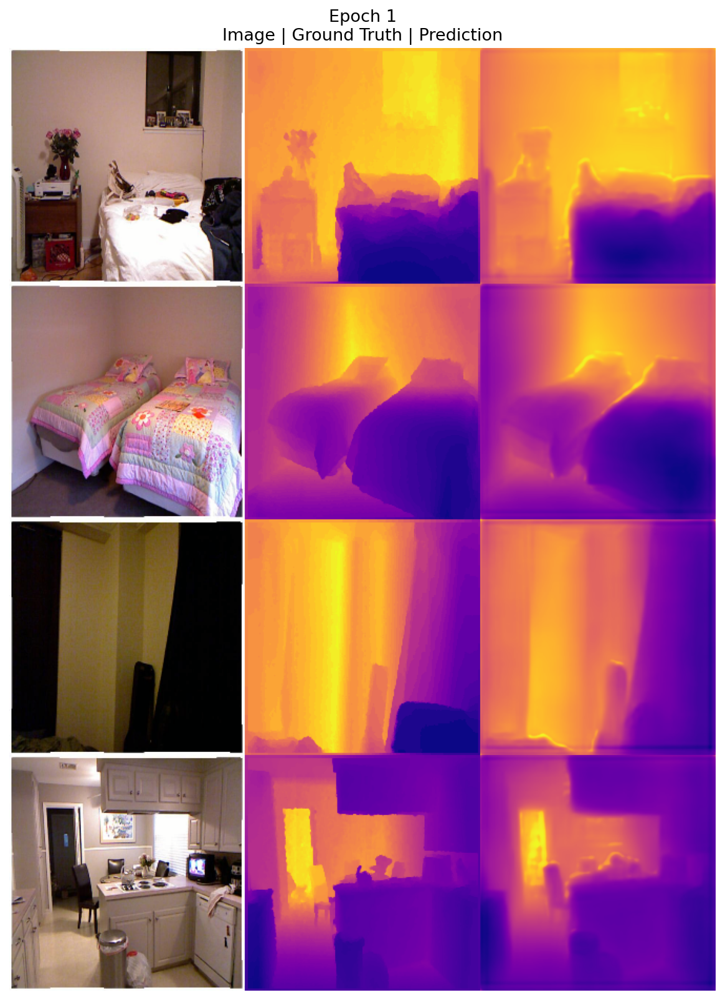


✅ Model saved to midas.pth
🏆 Best SSIM: 0.7847, Best MSE: 0.010548
📄 Training logs saved to training_logs.csv


In [9]:
from tqdm import tqdm
import pandas as pd
import torch.nn.functional as F
import torch

logs = pd.DataFrame(columns=['loss_train', 'ssim_train', 'mse_train', 'loss_val', 'ssim_val', 'mse_val'])

num_epochs = 6  # Set higher for real training
best_ssim = -1e9
best_mse = float('inf')

# Unnormalize function for ImageNet normalization
def unnorm(img):
    mean = torch.tensor([0.485, 0.456, 0.406]).view(3, 1, 1).to(img.device)
    std = torch.tensor([0.229, 0.224, 0.225]).view(3, 1, 1).to(img.device)
    return (img * std) + mean

# Invert + normalize MiDaS prediction
def normalize_and_invert(pred):
    pred = pred - pred.amin(dim=[1, 2, 3], keepdim=True)
    pred = pred / (pred.amax(dim=[1, 2, 3], keepdim=True) + 1e-8)
    return 1.0 - pred

# Freeze backbone (optional)
for name, param in model.named_parameters():
    if "backbone" in name:
        param.requires_grad = False
    else:
        param.requires_grad = True

optimizer = torch.optim.Adam(filter(lambda p: p.requires_grad, model.parameters()), lr=1e-4)

# --- Training Loop ---
for epoch in range(num_epochs):
    model.train()
    train_loss = 0.0
    ssim_train = 0.0
    mse_train = 0.0

    pbar = tqdm(train_dl, desc=f"[Epoch {epoch+1}/{num_epochs}] Training")
    for images, depths in pbar:
        images, depths = images.to(device), depths.to(device)

        # Unnormalize images and convert to PIL
        unnorm_imgs = [to_pil_image(unnorm(img).clamp(0, 1).cpu()) for img in images]
        inputs = processor(images=unnorm_imgs, return_tensors="pt").to(device)

        outputs = model(**inputs)
        preds = outputs.predicted_depth

        if preds.ndim == 3:
            preds = preds.unsqueeze(1)
        if preds.shape[-2:] != depths.shape[-2:]:
            preds = F.interpolate(preds, size=depths.shape[-2:], mode='bilinear', align_corners=False)

        preds = normalize_and_invert(preds)

        # Normalize GT depth
        depths = (depths - depths.amin(dim=[1, 2, 3], keepdim=True)) / \
                 (depths.amax(dim=[1, 2, 3], keepdim=True) - depths.amin(dim=[1, 2, 3], keepdim=True) + 1e-8)

        loss = criterion(preds, depths)
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        train_loss += loss.item()
        ssim_train += ssim_metric(preds, depths).item()
        mse_train += mse_metric(preds, depths).item()

        pbar.set_postfix(loss=loss.item())

    # --- Validation ---
    model.eval()
    val_loss = 0.0
    ssim_val = 0.0
    mse_val = 0.0

    val_batch_images = None
    val_batch_depths = None
    val_batch_preds = None

    val_pbar = tqdm(val_dl, desc=f"[Epoch {epoch+1}/{num_epochs}] Validation")
    with torch.no_grad():
        for i, (images, depths) in enumerate(val_pbar):
            images, depths = images.to(device), depths.to(device)

            unnorm_imgs = [to_pil_image(unnorm(img).clamp(0, 1).cpu()) for img in images]
            inputs = processor(images=unnorm_imgs, return_tensors="pt").to(device)

            preds = model(**inputs).predicted_depth
            if preds.ndim == 3:
                preds = preds.unsqueeze(1)
            if preds.shape[-2:] != depths.shape[-2:]:
                preds = F.interpolate(preds, size=depths.shape[-2:], mode='bilinear', align_corners=False)

            preds = normalize_and_invert(preds)

            depths = (depths - depths.amin(dim=[1, 2, 3], keepdim=True)) / \
                     (depths.amax(dim=[1, 2, 3], keepdim=True) - depths.amin(dim=[1, 2, 3], keepdim=True) + 1e-8)

            batch_loss = criterion(preds, depths).item()
            val_loss += batch_loss
            ssim_val += ssim_metric(preds, depths).item()
            mse_val += mse_metric(preds, depths).item()

            if i == 0:
                val_batch_images = images
                val_batch_depths = depths
                val_batch_preds = preds

            val_pbar.set_postfix(loss=val_loss / (i + 1))

    # --- Logging ---
    n_train = len(train_dl)
    n_val = len(val_dl)
    row = {
        'loss_train': train_loss / n_train,
        'ssim_train': ssim_train / n_train,
        'mse_train': mse_train / n_train,
        'loss_val': val_loss / n_val,
        'ssim_val': ssim_val / n_val,
        'mse_val': mse_val / n_val,
    }
    logs.loc[epoch] = row
    print(f"\n📊 Epoch {epoch+1}/{num_epochs} Summary:")
    print(f"   🔹 Train Loss: {row['loss_train']:.4f} | SSIM: {row['ssim_train']:.4f} | MSE: {row['mse_train']:.4f}")
    print(f"   🔹 Val   Loss: {row['loss_val']:.4f} | SSIM: {row['ssim_val']:.4f} | MSE: {row['mse_val']:.4f}")

    best_ssim = max(best_ssim, row['ssim_val'])
    best_mse = min(best_mse, row['mse_val'])

    # --- Visualization ---
    plot_vals(val_batch_images, val_batch_preds, val_batch_depths, n=4, figsize=(10, 3), title=f"Epoch {epoch+1}")

# --- Save Model & Logs ---
model_path = "midas.pth"
torch.save(model.state_dict(), model_path)
print(f"\n✅ Model saved to {model_path}")
print(f"🏆 Best SSIM: {best_ssim:.4f}, Best MSE: {best_mse:.6f}")

logs.to_csv("training_logs.csv", index=False)
print("📄 Training logs saved to training_logs.csv")

In [24]:
import matplotlib.pyplot as plt
import torch
import numpy as np
import torchvision.transforms.functional as TF

def plot_error_and_confidence_maps(imgs, preds, targets, n=4):
    fig, axs = plt.subplots(n, 5, figsize=(18, 3 * n))
    axs = axs.reshape(n, 5)

    for i in range(n):
        img = imgs[i].cpu()  # [C, H, W]
        pred = preds[i, 0].cpu()  # [H, W]
        target = targets[i, 0].cpu()  # [H, W]

        # Unnormalize the image if needed
        img = unnormalize(img)  # You must define this if normalization was applied
        img = torch.clamp(img, 0, 1)
        img = img.permute(1, 2, 0).numpy()  # [H, W, C]
        img = (img * 255).astype(np.uint8)

        # Error Map
        error_map = torch.abs(pred - target)

        # Confidence Map (inverse of error map)
        confidence_map = 1.0 - error_map / (error_map.max() + 1e-8)

        # Input Image
        axs[i][0].imshow(img)
        axs[i][0].set_title("Input Image")

        # Predicted Depth
        axs[i][1].imshow(pred, cmap='inferno')
        axs[i][1].set_title("Predicted Depth")

        # Ground Truth Depth
        axs[i][2].imshow(target, cmap='inferno')
        axs[i][2].set_title("Ground Truth Depth")

        # Error Map
        im_err = axs[i][3].imshow(error_map, cmap='hot')
        fig.colorbar(im_err, ax=axs[i][3], fraction=0.046, pad=0.04)
        axs[i][3].set_title(f"Error Map\n(mean: {error_map.mean():.3f})")

        # Confidence Map
        im_conf = axs[i][4].imshow(confidence_map, cmap='viridis')
        fig.colorbar(im_conf, ax=axs[i][4], fraction=0.046, pad=0.04)
        axs[i][4].set_title(f"Confidence Map\n(mean: {confidence_map.mean():.3f})")

        for ax in axs[i]:
            ax.axis('off')

    plt.tight_layout()
    plt.show()


<ipython-input-25-8f83399831f3>:11: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  best_sd = torch.load('/kaggle/working/midas.pth')
<ipython-input-25-8f83399831f3>:35: Futur

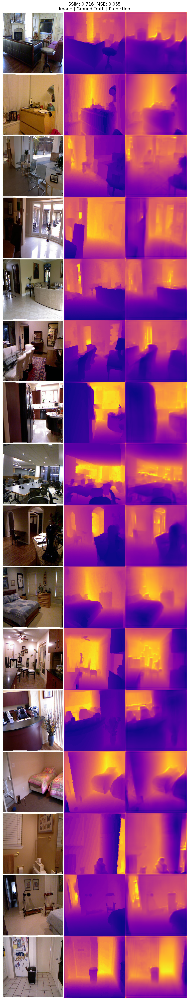

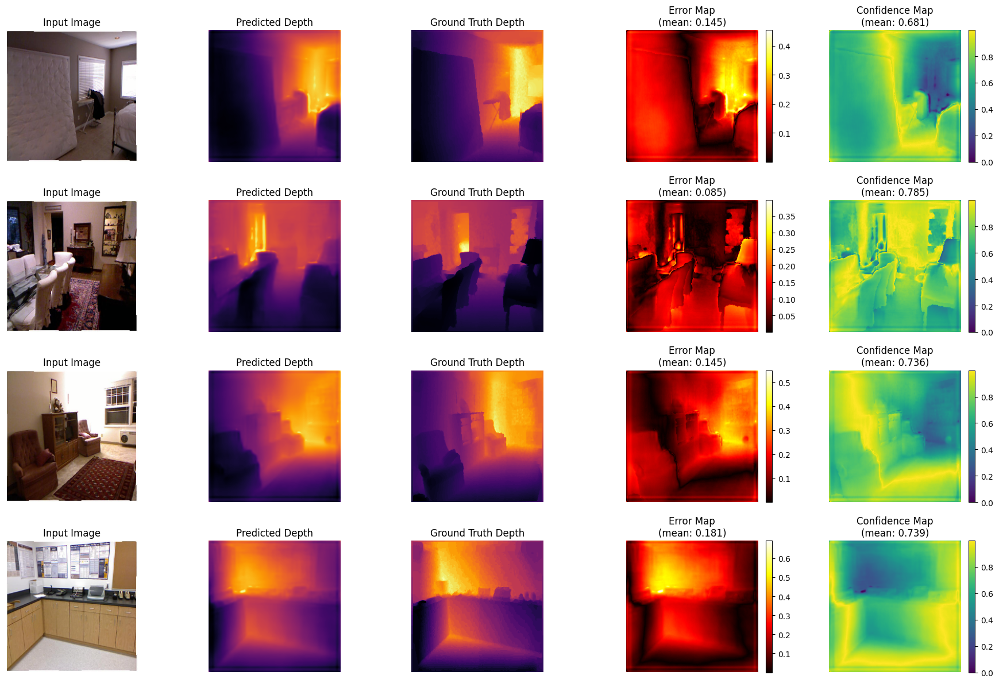

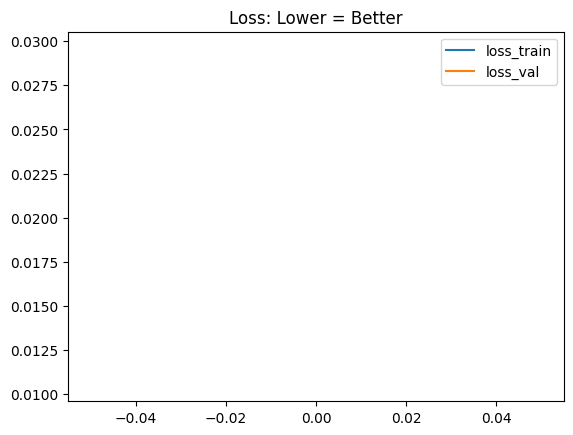

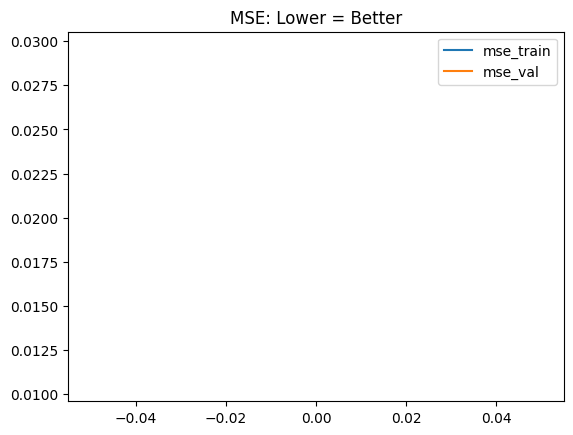

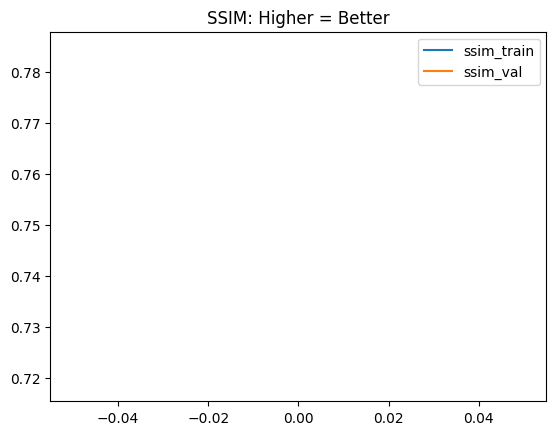


✅ Model saved to midas.pth
🏆 Best SSIM: 0.7160
🏆 Best MSE: 0.055125
📄 Training logs saved to training_logs.csv


In [25]:
import torch
from torchmetrics import MetricCollection
from torchmetrics.image.ssim import StructuralSimilarityIndexMeasure as SSIM
from torchmetrics.regression import MeanSquaredError as MSE
from torch.cuda.amp import autocast
from tqdm import tqdm
import matplotlib.pyplot as plt
import pandas as pd

# Load best model
best_sd = torch.load('/kaggle/working/midas.pth')
model.load_state_dict(best_sd)

# Metrics
metrics = MetricCollection([
    SSIM(data_range=1.0),  # SSIM expects values in [0, 1]
    MSE()
]).to(device)

def normalize_and_invert(pred):
    # Ensure pred is [B, 1, H, W]
    if pred.ndim == 3:
        pred = pred.unsqueeze(1)
    elif pred.ndim == 2:
        pred = pred.unsqueeze(0).unsqueeze(0)
    pred = pred - pred.amin(dim=[1, 2, 3], keepdim=True)
    pred = pred / (pred.amax(dim=[1, 2, 3], keepdim=True) + 1e-8)
    return 1.0 - pred


# 🧪 Testing
all_imgs, all_preds, all_targets = [], [], []
model.eval()
with torch.no_grad():
    with autocast():
        for img, mask in tqdm(test_dl, desc="Testing", total=len(test_dl)):
            img, mask = img.to(device), mask.to(device)
            outputs = model(img)
            preds = outputs.predicted_depth  # ✅ Extract from DepthEstimatorOutput
            preds = normalize_and_invert(preds)
            all_imgs.append(img)
            all_preds.append(preds)
            all_targets.append(mask)

# Stack and fix shapes
all_imgs = torch.vstack(all_imgs)
all_preds = torch.vstack(all_preds)
all_targets = torch.vstack(all_targets)

# Ensure shapes match for SSIM: [B, 1, H, W]
if all_preds.ndim == 3:
    all_preds = all_preds.unsqueeze(1)
if all_targets.ndim == 3:
    all_targets = all_targets.unsqueeze(1)

# Compute metrics
test_metrics = metrics.clone()
test_metrics(all_preds, all_targets)
m = test_metrics.compute()

# Title for visualizations
title = f"SSIM: {m['StructuralSimilarityIndexMeasure'].cpu().item():.3f}  " \
        f"MSE: {m['MeanSquaredError'].cpu().item():.3f}"

# 🔍 Plot predictions
plot_vals(
    all_imgs.cpu(),
    all_preds.cpu(),
    all_targets.cpu(),
    n=16,
    figsize=(10, 15),
    title=title
)

plot_error_and_confidence_maps(
    all_imgs.cpu(),
    all_preds.cpu(),
    all_targets.cpu(),
    n=4
)

# 📊 Plot training logs
logs['loss_train'].plot()
logs['loss_val'].plot()
plt.title('Loss: Lower = Better')
plt.legend()
plt.show()

logs['mse_train'].plot()
logs['mse_val'].plot()
plt.title('MSE: Lower = Better')
plt.legend()
plt.show()

logs['ssim_train'].plot()
logs['ssim_val'].plot()
plt.title('SSIM: Higher = Better')
plt.legend()
plt.show()

# ✅ Save logs and model
torch.save(model.state_dict(), "midas.pth")
logs.to_csv("training_logs.csv", index=False)

# ✅ Print final metrics
print("\n✅ Model saved to midas.pth")
print(f"🏆 Best SSIM: {m['StructuralSimilarityIndexMeasure'].cpu().item():.4f}")
print(f"🏆 Best MSE: {m['MeanSquaredError'].cpu().item():.6f}")
print("📄 Training logs saved to training_logs.csv")

In [12]:
# dummy_input = torch.randn(1, 3, 480, 640).to(device)
# model.eval()
# onnx_path = "midas.onnx"
# torch.onnx.export(model.module, dummy_input, onnx_path, input_names=["image"], output_names=["depth"], opset_version=11)
# print(f"🔁 Model converted to ONNX format: {onnx_path}")

/usr/local/lib/python3.10/dist-packages/transformers/models/swinv2/modeling_swinv2.py:393: TracerWarning: Converting a tensor to a Python boolean might cause the trace to be incorrect. We can't record the data flow of Python values, so this value will be treated as a constant in the future. This means that the trace might not generalize to other inputs!
  if width % self.patch_size[1] != 0:
/usr/local/lib/python3.10/dist-packages/transformers/models/swinv2/modeling_swinv2.py:396: TracerWarning: Converting a tensor to a Python boolean might cause the trace to be incorrect. We can't record the data flow of Python values, so this value will be treated as a constant in the future. This means that the trace might not generalize to other inputs!
  if height % self.patch_size[0] != 0:
/usr/local/lib/python3.10/dist-packages/transformers/models/swinv2/modeling_swinv2.py:794: TracerWarning: Converting a tensor to a Python boolean might cause the trace to be incorrect. We can't record the data f

🔁 Model converted to ONNX format: midas.onnx


In [17]:
%%capture
!pip install qai-hub

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 101.6/101.6 kB 2.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 83.2/83.2 kB 5.1 MB/s eta 0:00:00
  Attempting uninstall: s3transfer
    Found existing installation: s3transfer 0.11.2
    Uninstalling s3transfer-0.11.2:
      Successfully uninstalled s3transfer-0.11.2
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
boto3 1.36.23 requires s3transfer<0.12.0,>=0.11.0, but you have s3transfer 0.10.4 which is incompatible.


In [18]:
! qai-hub configure --api_token f0303b7ee7e33b83a9cb5c542745c3b40fd33516

qai-hub configuration saved to /root/.qai_hub/client.ini
==================== /root/.qai_hub/client.ini ====================
[api]
api_token = f0303b7ee7e33b83a9cb5c542745c3b40fd33516
api_url = https://app.aihub.qualcomm.com
web_url = https://app.aihub.qualcomm.com
verbose = True




In [19]:
import numpy as np
import qai_hub as hub

# Load your optimized model
optimized_model = "/kaggle/working/midas.onnx"

# Prepare input data
sample_input = np.random.random((1, 3, 480, 640)).astype(np.float32)

# Specify the target device
device = hub.Device("Samsung Galaxy S24 (Family)")

# Submit the inference job
inference_job = hub.submit_inference_job(
    model=optimized_model,
    device=device,
    inputs={"image": [sample_input]},
)

print("⏳ Running inference...")
inference_job.wait()

Uploading midas.onnx


100%|██████████| 153M/153M [00:01<00:00, 82.8MB/s] 
Uploading dataset: 3.20MB [00:00, 6.94MB/s]                            12.0MB/s]


Scheduled inference job (jp3v0zrlg) successfully. To see the status and results:
    https://app.aihub.qualcomm.com/jobs/jp3v0zrlg/

⏳ Running inference...
Waiting for inference job (jp3v0zrlg) completion. Type Ctrl+C to stop waiting at any time.
    ✅ SUCCESS                          


JobStatus
---------
code    : SUCCESS
message : 

In [23]:
import numpy as np
import qai_hub as hub

# Load your optimized model path
optimized_model_path = "/kaggle/working/midas.onnx"

# Target device
device = hub.Device("Samsung Galaxy S24 (Family)")

# ---------------------------
# Step 1: Compile the model
# ---------------------------
compile_job = hub.submit_compile_job(
    model=optimized_model_path,
    device=device,
    name="midas_compile"
)

print("⏳ Compiling the model...")
compile_job.wait()
compile_job.download_results(artifacts_dir="./compile_job_results")

compiled_model = compile_job.get_target_model()

# ---------------------------
# Step 2: Run inference
# ---------------------------
sample_input = np.random.random((1, 3, 480, 640)).astype(np.float32)

inference_job = hub.submit_inference_job(
    model=compiled_model,
    device=device,
    inputs={"image": [sample_input]},
)

print("⏳ Running inference...")
inference_job.wait()

# ---------------------------
# Step 3: Profile the compiled model
# ---------------------------
profile_job = hub.submit_profile_job(
    name='midas_depth_profile',
    model=compiled_model,
    device=device
)

print("⏳ Profiling on device...")
profile_job.wait()
profile_job.download_results(artifacts_dir="./profile_job_results")

profile_result = profile_job.download_profile()

print("\n✅ Profile Job Completed!")
print(f"📄 Name: {profile_job.name}")
print(f"📱 Target Device: {profile_job.device.name}")


Uploading midas.onnx


100%|██████████| 153M/153M [00:01<00:00, 84.3MB/s] 


Scheduled compile job (jp1yznk2p) successfully. To see the status and results:
    https://app.aihub.qualcomm.com/jobs/jp1yznk2p/

⏳ Compiling the model...
Waiting for compile job (jp1yznk2p) completion. Type Ctrl+C to stop waiting at any time.
    ✅ SUCCESS                          


job_jp1yznk2p_optimized_tflite_mq3417ern.tflite: 100%|██████████| 214M/214M [00:02<00:00, 76.4MB/s] 


Downloaded model to /kaggle/working/compile_job_results/job_jp1yznk2p_optimized_tflite_mq3417ern.tflite


Uploading dataset: 3.19MB [00:00, 7.22MB/s]                            17.8MB/s]


Scheduled inference job (jgde1dye5) successfully. To see the status and results:
    https://app.aihub.qualcomm.com/jobs/jgde1dye5/

⏳ Running inference...
Waiting for inference job (jgde1dye5) completion. Type Ctrl+C to stop waiting at any time.
    ✅ SUCCESS                          
Scheduled profile job (j5mqx01wp) successfully. To see the status and results:
    https://app.aihub.qualcomm.com/jobs/j5mqx01wp/

⏳ Profiling on device...
Waiting for profile job (j5mqx01wp) completion. Type Ctrl+C to stop waiting at any time.
    ✅ SUCCESS                          
Saved profile results to /kaggle/working/profile_job_results/midas_depth_profile_j5mqx01wp_results.json

✅ Profile Job Completed!
📄 Name: midas_depth_profile
📱 Target Device: Samsung Galaxy S24 (Family)


In [20]:
# ---------------------------
# Profile the compiled model
# ---------------------------
profile_job = hub.submit_profile_job(
    name='unetplusplus_depth_profile',
    model=compiled_model,
    device=device
)

print("⏳ Profiling on device...")
profile_job.wait()
profile_job.download_results(artifacts_dir="./profile_job_results")

NameError: name 'compiled_model' is not defined

In [ ]:
profile_result = profile_job.download_profile()
print("\n✅ Profile Job Completed!")
print(f"📄 Name: {profile_job.name}")
print(f"📱 Target Device: {profile_job.device.name}")